In [1]:
from financial_market import *

In [2]:
df_concat, df_sector_dict, symbols = load_dataframe()
df_concat

,symbol,security,sec_filings,gics_sector,gics_sub-industry,headquarters_location,date_first_added,cik,founded
253,IPG,The Interpublic Group of Companies,reports,Communication Services,Advertising,"New York City, New York",1992-10-01,51644,1961 (1930)
51,T,AT&T,reports,Communication Services,Integrated Telecommunication Services,"Dallas, Texas",1983-11-30,732717,1983 (1885)
470,VZ,Verizon,reports,Communication Services,Integrated Telecommunication Services,"New York City, New York",1983-11-30,732712,1983 (1877)
353,OMC,Omnicom Group,reports,Communication Services,Advertising,"New York City, New York",NaN,29989,1986
361,PARA,Paramount Global,reports,Communication Services,Movies & Entertainment,"New York City, New York",NaN,813828,2019 (1952)
...,...,...,...,...,...,...,...,...,...
117,CMS,CMS Energy,reports,Utilities,Multi-Utilities,"Jackson, Michigan",1999-05-03,811156,1886
11,AES,AES Corporation,reports,Utilities,Independent Power Producers & Energy Traders,"Arlington, Virginia",1998-10-02,874761,1981
98,CNP,CenterPoint Energy,reports,Utilities,Multi-Utilities,"Houston, Texas",1985-07-31,1130310,1882
378,PPL,PPL Corporation,reports,Utilities,Electric Utilities,"Allentown, Pennsylvania",NaN,922224,1920


In [3]:
df, df_sector, df_both, not_done_for = get_closing_prices(symbols, df_sector_dict)

TPR not in past
- BF.B: No data found for this date range, symbol may be delisted
BF.B delisted
MET not in past
HWM not in past
WRK not in past
PARA not in past


In [4]:
# these have become nan because symbols has values that aren't collected
print(df.isnull().values.any(), not_done_for)

False ['BF.B']


In [5]:
print(df.columns[df.isna().any()].tolist())

[]


In [6]:
df.to_excel("output/sp500_stock_names.xlsx")
df_sector.to_excel("output/sp500_sector_names.xlsx")
df_both.to_excel("output/sp500_both.xlsx")

In [7]:
df.to_csv("output/sp500_stock_names.csv")
df_sector.to_csv("output/sp500_sector_names.csv")
df_both.to_csv("output/sp500_both.csv")

[*********************100%***********************]  1 of 1 completed


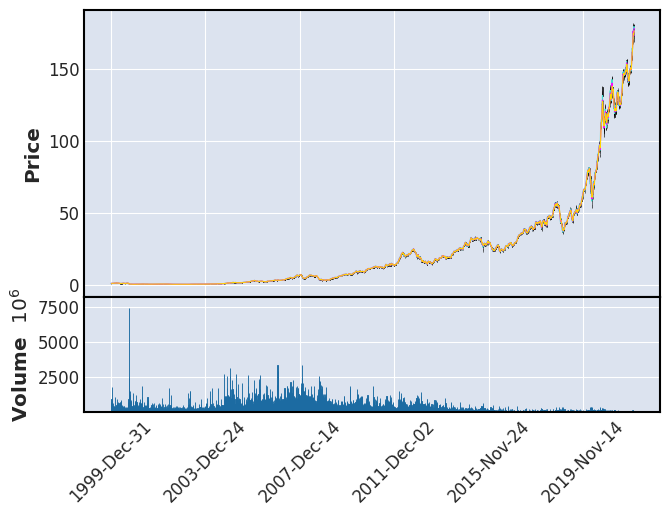

In [8]:
plot_candlesticks('AAPL')

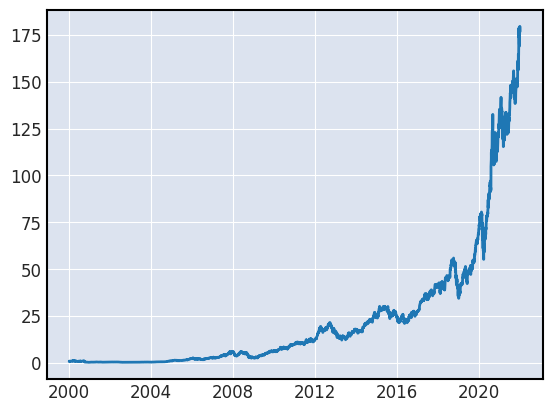

In [9]:
plt.plot(df["date"], df["AAPL"])

In [10]:
df = pd.read_csv("output/sp500_sector_names.csv", index_col=0)
df = df.drop(['date'], axis=1)

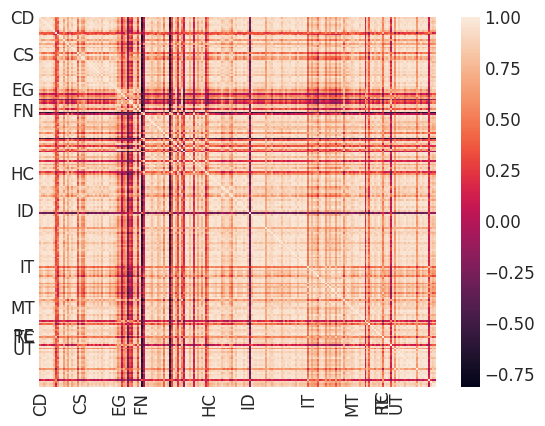

In [11]:
plot_corr_mat(df)

In [12]:
dataframe_stock = pd.read_csv("output/sp500_stock_names.csv", index_col=None)
df = dataframe_stock.iloc[:,1:]
df["date"] = df['date'].apply(pd.to_datetime)

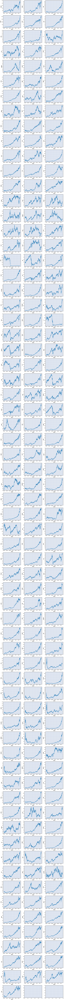

In [13]:
plot_all_charts(df)

In [14]:
dataframe_sector = pd.read_excel("output/sp500_sector_names.xlsx",sheet_name="Sheet1",index_col=None)
df = dataframe_sector.iloc[:,2:]
dict_col = ticker_val_locations(df)

for i in df.columns:
    df[i] = np.log(df[i]/df[i].shift(1))
df = df.iloc[1:,:]

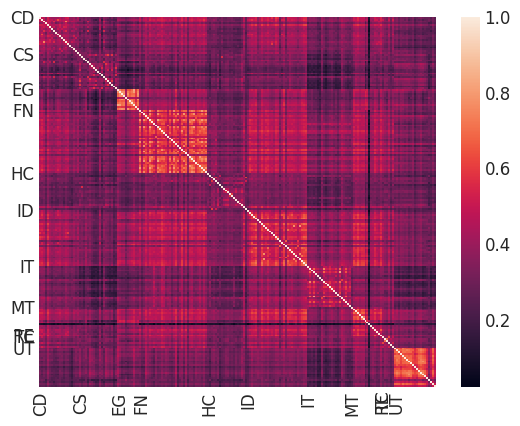

In [15]:
plot_corr_mat(df)

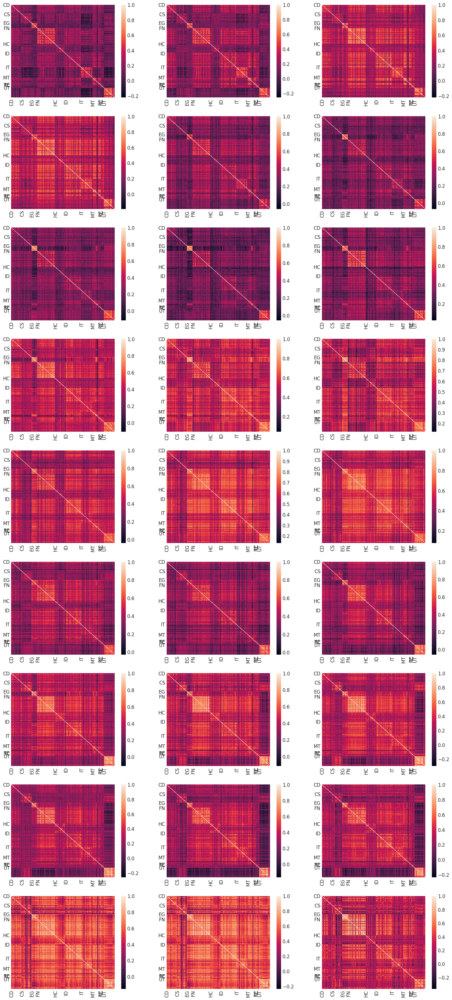

In [16]:
fig, axes = plt.subplots(len(df) // (200 * 3), 3, figsize=(20, 5 * (len(df) // (200 * 3))))
count = 0
for i in range(0, len(df) - 200, 200):
    p = sns.heatmap(df.iloc[i:i+400,:].corr(), ax=axes[count//3, count%3])
    p.set_xticks(ticks=list(dict_col.values()), labels=list(dict_col.keys()))
    p.set_yticks(ticks=list(dict_col.values()), labels=list(dict_col.keys()))
    count += 1